In [1]:
pwd

'/kaggle/working'

In [2]:
import matplotlib.pyplot as plt
import os
import pandas as pd

In [3]:
print(os.listdir('/kaggle/input/tomato'))

['valid', 'train']


In [4]:
data='/kaggle/input/tomato/train'
val_path='/kaggle/input/tomato/valid'

In [5]:
# count = 0
# for root, folders, filenames in os.walk('/kaggle/input/tomato'):
#    print(root, folders)

In [6]:
categories = []
train = []
valid = []
test = []

folders = os.listdir('/kaggle/input/tomato/train')
for f in folders:
    categories.append(f)
    train_count = len(os.listdir(os.path.join('/kaggle/input/tomato/train', f)))
    train.append(train_count)
    test.append(int(train_count * 0.2))

folders = os.listdir('/kaggle/input/tomato/valid')
for f in folders:
    valid.append(len(os.listdir(os.path.join('/kaggle/input/tomato/valid', f))))

data_count = pd.DataFrame({'categories': categories,
                           'train': train,
                           'valid': valid,
                           'test': test                     
                          })

print(data_count)

                              categories  train  valid  test
0                            Late_blight   3113    792   622
1          Tomato_Yellow_Leaf_Curl_Virus   2039    498   407
2                     Septoria_leaf_spot   2882    746   576
3                           Early_blight   2455    643   491
4   Spider_mites Two-spotted_spider_mite   1747    435   349
5                         powdery_mildew   1004    252   200
6                                healthy   3051    805   610
7                         Bacterial_spot   2826    732   565
8                            Target_Spot   1827    457   365
9                    Tomato_mosaic_virus   2153    584   430
10                             Leaf_Mold   2754    739   550


In [7]:
#@title Creating Training DataFrame
def create_df(path):
  data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
     data.append(['/kaggle/input/tomato/train/' + folder + '/' + file, folder.split('-')[-1]])
  return pd.DataFrame(data,columns=['filename','label'])

In [8]:
df=create_df(data)

In [9]:
#@title Creating Validation DataFrame
def create_validation_df(path):
  validation_data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
      validation_data.append(['/kaggle/input/tomato/valid/' + folder + '/'+file,folder.split('-')[-1]])
  return pd.DataFrame(validation_data,columns=['filename','label'])

In [10]:
val_df=create_validation_df(val_path)

In [11]:
from sklearn.model_selection import train_test_split

X = df['filename']
y = df['label']

X_train, X_test, y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)


In [12]:
train_df = pd.DataFrame(X_train)
train_df['label'] = y_train

In [13]:
test_df=pd.DataFrame(X_test)
test_df['label']=y_test

In [14]:
IMG_SIZE = 224
BATCH_SIZE=32
Epochs=64

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [16]:
import tensorflow as tf

# Data Augmentation pipeline
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomContrast(0.3),
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomRotation(0.2)
])


In [17]:
# train_datagen = ImageDataGenerator(
#     rescale=1/255.,
#     preprocessing_function=lambda img: data_augmentation(img)
# )
# # train_datagen = ImageDataGenerator(rescale=1/255.)
# test_datagen = ImageDataGenerator(rescale=1/255.)
# val_datagen  = ImageDataGenerator(rescale=1/255.)

In [18]:
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)
val_datagen  = ImageDataGenerator(rescale=1/255.)

In [19]:
# Create data generators from dataframes
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=32
)

Found 20680 validated image filenames belonging to 11 classes.


In [20]:
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=50,
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=BATCH_SIZE,
    shuffle=False
)

print(train_generator.class_indices)
print(val_generator.class_indices)
print(test_generator.class_indices)

Found 6683 validated image filenames belonging to 11 classes.
Found 5171 validated image filenames belonging to 11 classes.
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}


In [21]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow import keras

In [22]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adamax
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score 
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [23]:
# from tensorflow.keras.models import Sequential, Model
# from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
# from tensorflow.keras.optimizers import Adamax
# from sklearn.metrics import accuracy_score
# from sklearn.metrics import precision_score 
# from sklearn.metrics import recall_score
# from sklearn.metrics import f1_score
# from keras import regularizers
# from keras.callbacks import EarlyStopping

In [24]:
NUM_CLASSES = 11

In [25]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3), pooling='max')
x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.45)(x)
predictions= Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 512)            │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │         1,41

 Total params: 14,783,819 (56.40 MB)

 Trainable params: 14,782,795 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [26]:
# # Input layer
# input_layer = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# # Entry module
# def entry_module(input_layer):
#     # Multi-scale block
#     conv1_1 = layers.Conv2D(24, (7, 7), padding='same', activation='relu')(input_layer)
#     conv1_2 = layers.Conv2D(24, (5, 5), padding='same', activation='relu')(input_layer)
#     conv1_3 = layers.Conv2D(48, (3, 3), padding='same', activation='relu')(input_layer)

#     # Concatenate multi-scale features
#     concatenated = layers.concatenate([conv1_1, conv1_2, conv1_3])

#     # 1x1 convolution to fuse features and reduce complexity
#     fused_features = layers.Conv2D(64, (1, 1), padding='same', activation='relu')(concatenated)
    
#     return fused_features

# # Middle module
# def middle_module(x):
#     # FR Block 1
#     conv3 = layers.Conv2D(64, (5, 5), padding='same', activation='relu')(x)
#     conv4 = layers.Conv2D(96, (1, 1), padding='same', activation='relu')(conv3)
#     pool1 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv4)

#     # FR Block 2
#     conv5 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(pool1)
#     conv6 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(conv5)
#     conv7 = layers.Conv2D(192, (1, 1), padding='same', activation='relu')(conv6)
#     pool2 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv7)

#     # FR Block 3
#     conv8 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(pool2)
#     conv9 = layers.Conv2D(192, (1, 1), padding='same', activation='relu')(conv8)
#     pool3 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv9)

#     return pool3

# # Rear module
# def rear_module(x):
#     # Global Average Pooling
#     x = layers.GlobalAveragePooling2D()(x)
#     # Fully connected layer
#     x = layers.Dense(128, activation='relu')(x)
#     # Output layer
#     output = layers.Dense(11, activation='softmax')(x) 
#     return output


# # Building the MFRCNN model
# x = entry_module(input_layer)
# x = middle_module(x)
# output_layer = rear_module(x)

# # Create the model
# model = models.Model(inputs=input_layer, outputs=output_layer)

# # Compile the model
# model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.005, momentum=0.9),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# # Summary of the model
# model.summary()


In [27]:
# steps_per_epoch = len(train_generator) 
# epochs = 20000 // steps_per_epoch

In [28]:
# history = model.fit(
#     train_generator,
#     epochs=epochs,  
#     steps_per_epoch=steps_per_epoch,
#     validation_data=val_generator
# )

In [29]:
history = model.fit(train_generator, 
                    epochs=10, 
                    validation_data= val_generator)

Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1726243603.753987      97 service.cc:145] XLA service 0x79d9b40062c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1726243603.754054      97 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1726243625.217577      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


537/647 ━━━━━━━━━━━━━━━━━━━━ 24s 218ms/step - accuracy: 0.2001 - loss: 2.1962

I0000 00:00:1726243742.405540      98 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_10', 356 bytes spill stores, 356 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_9', 36 bytes spill stores, 36 bytes spill loads



647/647 ━━━━━━━━━━━━━━━━━━━━ 222s 301ms/step - accuracy: 0.2106 - loss: 2.1687 - val_accuracy: 0.1161 - val_loss: 5.4094
Epoch 2/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 153s 235ms/step - accuracy: 0.3952 - loss: 1.6980 - val_accuracy: 0.2836 - val_loss: 1.9761
Epoch 3/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 152s 233ms/step - accuracy: 0.4972 - loss: 1.4251 - val_accuracy: 0.4344 - val_loss: 1.5823
Epoch 4/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 152s 234ms/step - accuracy: 0.6229 - loss: 1.0884 - val_accuracy: 0.3124 - val_loss: 3.9987
Epoch 5/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 153s 235ms/step - accuracy: 0.6799 - loss: 0.9201 - val_accuracy: 0.6243 - val_loss: 1.0637
Epoch 6/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 152s 234ms/step - accuracy: 0.7274 - loss: 0.7880 - val_accuracy: 0.6973 - val_loss: 0.8240
Epoch 7/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 151s 232ms/step - accuracy: 0.7772 - loss: 0.6504 - val_accuracy: 0.7702 - val_loss: 0.6592
Epoch 8/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 152s 234ms/step - accuracy: 0.8181 - loss: 0.53

In [30]:
train_loss,train_acc=model.evaluate(train_generator)

647/647 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - accuracy: 0.8645 - loss: 0.4166


In [31]:
print('Training Accuracy: {:.2f}%'.format(train_acc * 100))
print('Training Loss: {:.2f}'.format(train_loss*100))

Training Accuracy: 86.34%
Training Loss: 41.24


In [32]:
val,acc=model.evaluate(test_generator)

162/162 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.8544 - loss: 0.4451


In [33]:
val,acc=model.evaluate(val_generator)

134/134 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - accuracy: 0.8245 - loss: 0.5273


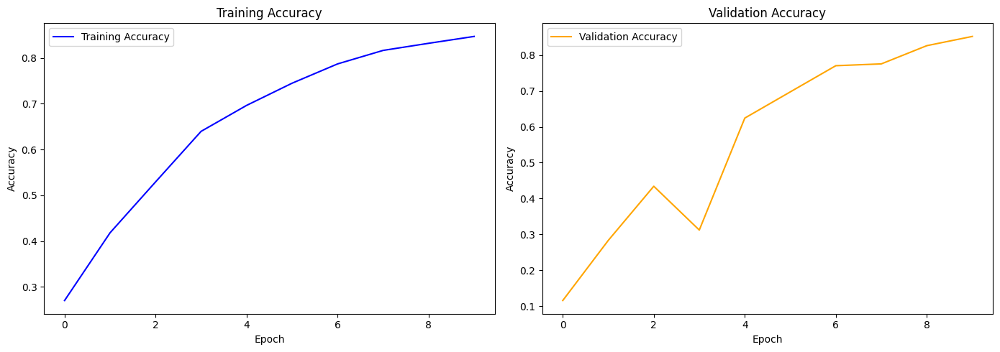

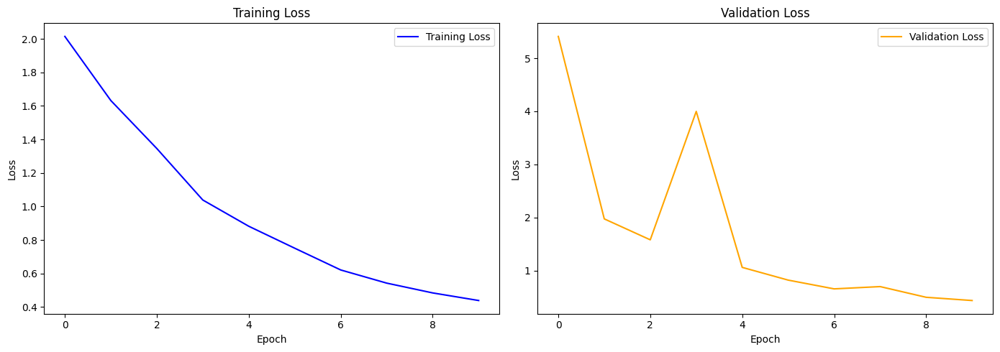

In [34]:
import matplotlib.pyplot as plt
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()


# Plot validation accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


# Plot training and validation loss
plt.figure(figsize=(14, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plot validation loss
plt.subplot(1, 2, 2)
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

162/162 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step


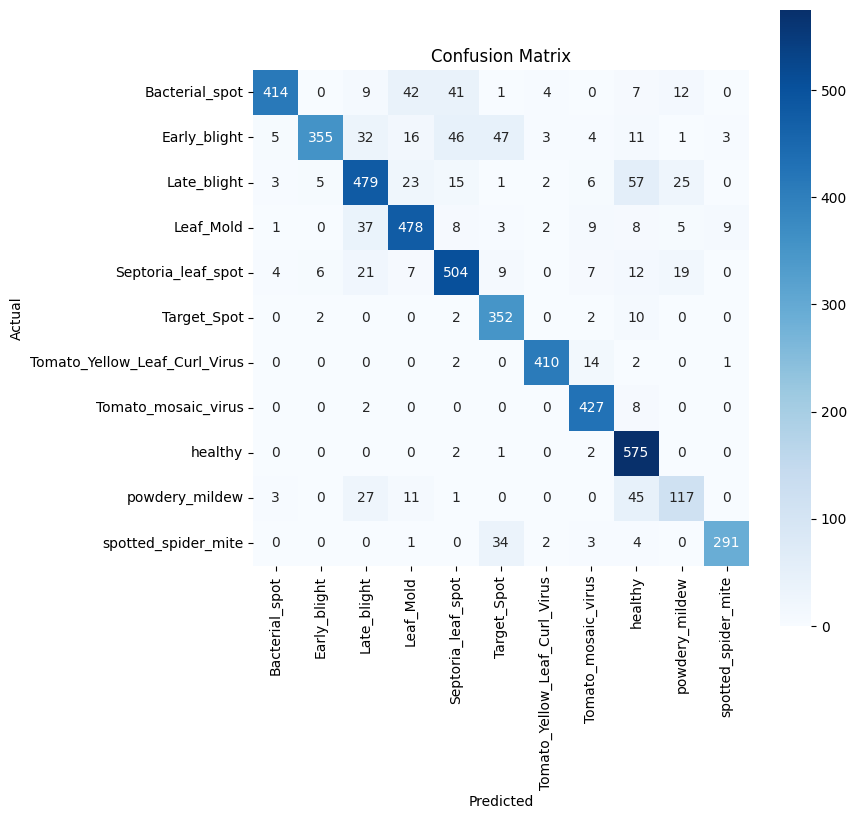

In [35]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Get predictions for the test data
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get true labels for the test data
true_classes = test_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

134/134 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step


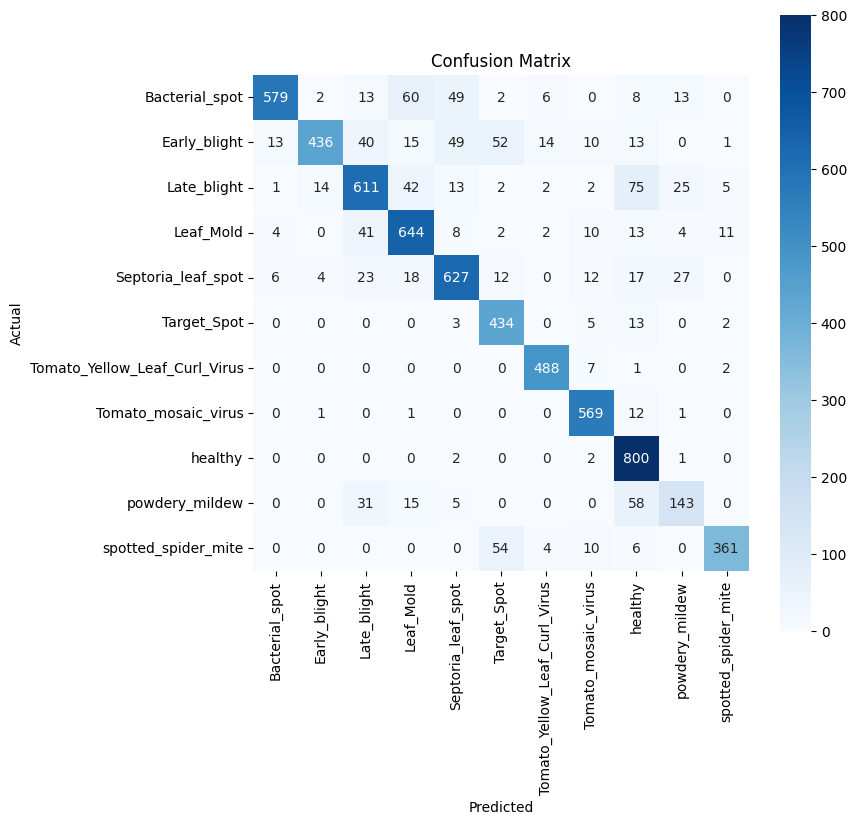

In [36]:
from sklearn.metrics import confusion_matrix
import numpy as np

y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

true_classes = val_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [37]:
precision = precision_score(true_classes, y_pred_classes, average='weighted')
recall = recall_score(true_classes, y_pred_classes, average='weighted')
f1 = f1_score(true_classes, y_pred_classes, average='weighted')
accuracy = accuracy_score(true_classes, y_pred_classes)

# Print metrics
print(f"Precision: {precision}")
print(f"Recall (Sensitivity): {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

Precision: 0.8590397589215066
Recall (Sensitivity): 0.8517133024090977
F1 Score: 0.8495163959633528
Accuracy: 0.8517133024090977


In [38]:
# Calculate overall accuracy
accuracy = accuracy_score(true_classes, y_pred_classes)
print(f"Overall Accuracy: {accuracy*100}")

# Calculate class-wise metrics
precision = precision_score(true_classes, y_pred_classes, average=None)
recall = recall_score(true_classes, y_pred_classes, average=None)
f1 = f1_score(true_classes, y_pred_classes, average=None)

# Get class labels from the generator
class_labels = list(test_generator.class_indices.keys())

# Create a DataFrame to display the results in a table format
metrics_df_MFRCNN = pd.DataFrame({
    'Class': class_labels,
    'Precision': precision,
    'Recall (Sensitivity)': recall,
    'F1 Score': f1
})

Overall Accuracy: 85.17133024090977


In [39]:
metrics_df_MFRCNN

,Class,Precision,Recall (Sensitivity),F1 Score
0,Bacterial_spot,0.960199,0.790984,0.867416
1,Early_blight,0.954048,0.678072,0.792727
2,Late_blight,0.805007,0.771465,0.787879
3,Leaf_Mold,0.810063,0.871448,0.839635
4,Septoria_leaf_spot,0.829365,0.840483,0.834887
5,Target_Spot,0.777778,0.949672,0.855172
6,Tomato_Yellow_Leaf_Curl_Virus,0.945736,0.979920,0.962525
7,Tomato_mosaic_virus,0.907496,0.974315,0.939719
8,healthy,0.787402,0.993789,0.878638
9,powdery_mildew,0.668224,0.567460,0.613734


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


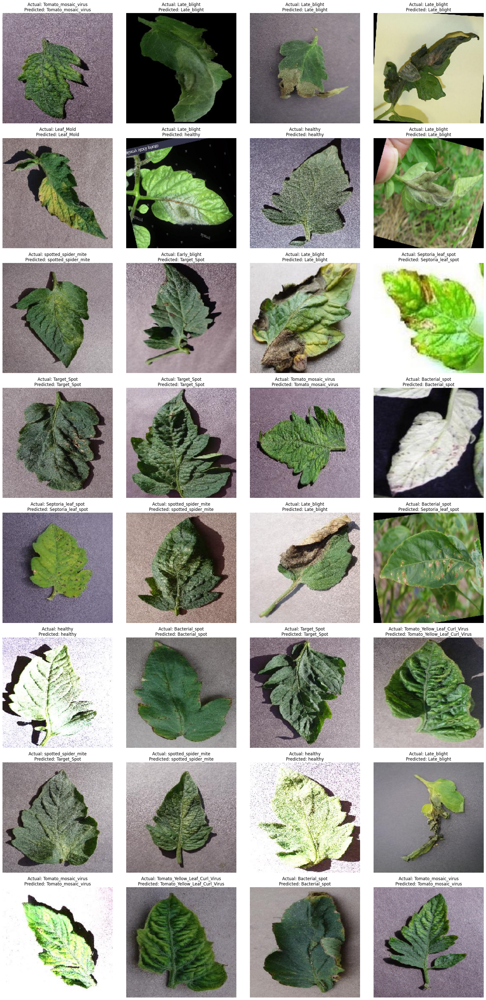

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Function to display images with predicted and actual labels
def display_predictions(generator, num_images=40):
    images, true_labels = next(generator)
    true_labels = np.argmax(true_labels, axis=1)
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    
    # Number of images actually available in the batch
    actual_num_images = min(num_images, len(images))
    
    plt.figure(figsize=(20, 40))
    
    num_rows = int(np.ceil(actual_num_images / 4))  # Calculate the number of rows needed for 4 columns
    num_cols = 4  # Number of columns
    
    for i in range(actual_num_images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_labels[true_labels[i]]}\nPredicted: {class_labels[predicted_labels[i]]}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display 40 images from the test set with predicted labels
display_predictions(test_generator, num_images=40)


In [41]:
metrics_df_MFRCNN.to_csv('vgg16_individual_class_metrics.csv')

In [42]:
model.save('Tomato_vgg16.h5')

In [43]:
from tensorflow.keras.models import load_model

In [44]:
tomato_model=load_model('Tomato_vgg16.h5')

In [45]:
img_path='/kaggle/input/tomato/valid/Bacterial_spot/014b58ae-091b-408a-ab4a-5a780cd1c3f3___GCREC_Bact.Sp 2971.JPG'

In [46]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Define the target image size
IMG_SIZE = 224

def preprocess_single_image(img_path):
    # Load the image with the target size
    img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    
    # Convert the image to a NumPy array
    img_array = image.img_to_array(img)
    
    # Normalize pixel values to [0, 1] range
    img_array /= 255.0
    # Expand dimensions to match the model's expected input shape
    img_array = np.expand_dims(img_array, axis=0)
    
    return img_array

# Example: Preprocess an image and predict using the model
img_data = preprocess_single_image(img_path)

# Make predictions with the model
predictions = tomato_model.predict(img_data)

# Get the predicted class index
predicted_class = np.argmax(predictions, axis=-1)

# Assuming class labels from your dataset
class_labels = ['Bacterial Spot', 'Early Blight', 'Late Blight','Leaf Mold',
                'Septoria Leaf Spot','Target Spot','Tomato Yellow Leaf Curl Virus',
                'Tomato Mosaic Virus','Healthy','Powdery_Mildew','Spotted Spider Mite' ] 
predicted_class_name = class_labels[predicted_class[0]]

print(f"Predicted class index: {predicted_class[0]}")
print(f"Predicted class name: {predicted_class_name}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted class index: 0
Predicted class name: Bacterial Spot


In [47]:
tomato_model.save_weights('tomato_model-vgg16.weights.h5')